# Pix2Pix GAN
Imagine a scenario where we have pairs of images that are related to each other (for
example, an image of edges of an object as input and an actual image of the object as
output). The challenge given is that we want to generate an image given the input
image of the edges of an object.

In this section, we will learn about the architecture to generate the image of a shoe
from a hand-drawn doodle (contours) of a shoe. The strategy that we will adopt to
generate a realistic image from the doodle is as follows:
1. Fetch a lot of actual images and create corresponding contours using
standard cv2 edge detection techniques.
2. Sample colors from patches of the original image so that the generator
knows the colors to generate.
3. Build a UNet architecture that takes the contours with sample patch colors
as input and predicts the corresponding image – this is our generator.
4. Build a discriminator architecture that takes an image and predicts whether
it is real or fake.
5. Train the generator and discriminator together to a point where the
generator can generate images that fool the discriminator.

In [ ]:
import os
if not os.path.exists('ShoeV2_photo'):
    !wget https://www.dropbox.com/s/g6b6gtvmdu0h77x/ShoeV2_photo.zip
    !unzip -q ShoeV2_photo.zip

In [ ]:
! pip install -U torch_snippets
from torch_snippets import *
device = 'cuda' if torch.cuda.is_available() else 'cpu'

Looking in indexes: https://pypi.org/simple, https://pypi.ngc.nvidia.com


For our problem, we want to draw the shoe given a contour (edge) and
sample patch colors of the shoe. In the next step, we will fetch the edge
given an image of a shoe. This way, we can train a model that reconstructs
an image of a shoe given a contour and sample patch colors of the shoe.

Since ```python import cv2``` is going to problem with recent update. So we have to ```python import cv2``` manually but need take certain steps necessarly at prior.

In [ ]:
!apt-get update

Hit:1 http://security.ubuntu.com/ubuntu focal-security InRelease
Hit:2 http://archive.ubuntu.com/ubuntu focal InRelease
Hit:3 http://archive.ubuntu.com/ubuntu focal-updates InRelease
Hit:4 http://archive.ubuntu.com/ubuntu focal-backports InRelease
Reading package lists... Done


In [ ]:
!apt install -y libgl1-mesa-glx

Reading package lists... Done
Building dependency tree       
Reading state information... Done
libgl1-mesa-glx is already the newest version (21.2.6-0ubuntu0.1~20.04.2).
0 upgraded, 0 newly installed, 0 to remove and 28 not upgraded.


In [ ]:
!pip install torch_summary 

Looking in indexes: https://pypi.org/simple, https://pypi.ngc.nvidia.com


In [ ]:
def detect_edges(img):
    img_gray = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)
    img_gray = cv2.bilateralFilter(img_gray, 5, 50, 50)
    img_gray_edges = cv2.Canny(img_gray, 45, 100)
    # invert black/white
    img_gray_edges = cv2.bitwise_not(img_gray_edges)
    img_edges = cv2.cvtColor(img_gray_edges, cv2.COLOR_GRAY2RGB)
    return img_edges

In the preceding code, we are leveraging the various methods available in
the OpenCV package to fetch edges within an image.

### Define the image transformation pipeline (preprocess and normalize)

In [ ]:
from torchsummary import *
from torchvision import transforms
import numpy as np, cv2

In [ ]:
IMAGE_SIZE = 256
preprocess = transforms.Compose([transforms.Lambda(lambda x: torch.Tensor(x.copy()).permute(2, 0, 1).to(device))])
normalize = lambda x: (x - 127.5)/127.5

Define the dataset class (`ShoesData`). This dataset class returns the original
image and the image with edges. One additional detail we will pass to the
network is the patches of color that are present in randomly chosen regions.
This way, we are enabling the user to take a hand-drawn contour image,
sprinkle the required colors at different parts of the image, and generate a
new image. A sample input (the third image) and output (the first image)
are shown here (best viewed in color):

<img src = 'assets/shoes.png'>

However, the input image we have in step 1 is just of the shoe (the first
image) – which we will use to extract the edges of the shoe (the
second image). Further, we will sprinkle color in the next step to fetch the
preceding image's input (the third image) – output (the first image)
combination.

In the following code, we will build the class that takes the contour images,
sprinkles colors, and returns the pair of color-sprinkled images and the
original shoe image (the image that generated contours)

### **Define the class ShoesData**

In [ ]:
# TODO: Define the class ShoesData
class ShoesData(Dataset):
    def __init__(self, items):
        self.items = items

    def __len__(self):
        return len(self.items)

    def __getitem__(self, ix):
        f = self.items[ix]
        try:
            im = read(f, 1)
        except:
            blank = preprocess(Blank, (IMAGE_SIZE, IMAGE_SIZE, 3))
            return blank, blank

        # Fetch the edges from image
        edges = detect_edges(im)

        # Resize and normalize the image and edge
        im, edges = resize(im, IMAGE_SIZE), resize(edges, IMAGE_SIZE)
        im, edges = normalize(im), normalize(edges)

        # Sprinkle color on edges image and preprocess the original and edges images
        self._draw_color_circles_src_img(edges, im)
        im, edges = preprocess(im), preprocess(edges)
        return edges, im

    # Define the functions to sprinkle color
    def _draw_color_circles_src_img(self, img_src, img_target):
        non_white_coords = self._get_non_white_coordinates(img_target)
        for center_y, center_x in non_white_coords:
            self._draw_color_circle_on_src_img(img_src, img_target, center_y, center_x)

    def _get_non_white_coordinates(self, img):
        non_white_mask = np.sum(img, axis=-1) < 2.75
        non_white_y, non_white_x = np.nonzero(non_white_mask)
        # randomly sample coordinate non_white coordinates
        n_non_white = len(non_white_y)
        n_color_points = min(n_non_white, 300)
        idxs = np.random.choice(n_non_white, n_color_points, replace=False)
        non_white_coords = list(zip(non_white_y[idxs], non_white_x[idxs]))
        return non_white_coords

    def _draw_color_circle_on_src_img(self, img_src, img_target, center_y, center_x):
        assert img_src.shape == img_target.shape
        y0, y1, x0, x1 = self._get_color_point_bbox_coords(center_y, center_x)
        color = np.mean(img_target[y0: y1, x0: x1], axis=(0, 1))
        img_src[y0: y1, x0: x1] = color

    def _get_color_point_bbox_coords(self, center_y, center_x):
        radius = 2
        y0 = max(0, center_y - radius + 1)
        y1 = min(IMAGE_SIZE, center_y + radius)
        x0 = max(0, center_x - radius + 1)
        x1 = min(IMAGE_SIZE, center_x + radius)
        return y0, y1, x0, x1

    def choose(self):
        return self[randint(len(self))]


> Define the `__getitem__` method. In this method, we will process the input
image to fetch an image with edges and then sprinkle the image with the
colors present in the original image. Here, we are fetching the edges of a
given image

#### **Define the training and validation data's corresponding datasets and dataloaders**

In [ ]:
from sklearn.model_selection import train_test_split

train_items, val_items = train_test_split(Glob('ShoeV2_photo/*.png'), test_size=0.2, random_state=2)
print('This is training items {}, This is a validation items {}'.format(len(train_items), len(val_items)))

train_ds, test_ds = ShoesData(train_items), ShoesData(val_items)
# print(train_ds, test_ds)
train_dl = DataLoader(train_ds, batch_size=32, shuffle=True)
val_dl = DataLoader(test_ds, batch_size=32, shuffle=True)

This is training items 3504, This is a validation items 877


In [ ]:
import cv2

In [ ]:
inspect(*next(iter(train_dl)))

Tensor	Shape: torch.Size([32, 3, 256, 256])	Min: -1.000	Max: 1.000	Mean: 0.873	dtype: torch.float32
Tensor	Shape: torch.Size([32, 3, 256, 256])	Min: -1.000	Max: 1.000	Mean: 0.592	dtype: torch.float32


### **Initialize weights so that they follow a normal distribution**

In [ ]:
def weights_init_normal(m):
    classname = m.__class__.__name__
    if classname.find('Conv') != -1:
        torch.nn.init.normal_(m.weight.data, 0.0, 0.02)
    elif classname.find('BatchNorm2d') != -1:
        torch.nn.init.normal_(m.weight.data, 1.0, 0.02)
        torch.nn.init.constant_(m.bias.data, 0.0)

### **Define UNetDown**

In [ ]:
class UNetDown(nn.Module):
    def __init__(self, in_size, out_size, normalize=True, dropout=0.0):
        super(UNetDown, self).__init__()
        layers = [nn.Conv2d(in_size, out_size, 4, 2, 1, bias=True)]
        if normalize:
            layers.append(nn.InstanceNorm2d(out_size))
        layers.append(nn.LeakyReLU(0.2, inplace=True))
        if dropout:
            layers.append(nn.Dropout(dropout))
        self.model = nn.Sequential(*layers)

    def forward(self, x):
        return self.model(x)

### **Define UNetUp**

In [ ]:
class UNetUp(nn.Module):
    def __init__(self, in_size, out_size, dropout=0.0):
        super(UNetUp, self).__init__()
        layers = [nn.ConvTranspose2d(in_size, out_size, 4, 2, 1, bias=False),
                  nn.InstanceNorm2d(out_size),
                  nn.ReLU(inplace=True)]

        if dropout:
            layers.append(nn.Dropout(dropout))
        self.model = nn.Sequential(*layers)

    def forward(self, x, skip_inputs):
        x = self.model(x)
        x = torch.cat((x, skip_inputs), 1)

        return x


### **Define the GeneratorUNet Class** 

In [ ]:

# Define the GeneratorUNet Class
class GeneratorUNet(nn.Module):
    def __init__(self, in_channels=3, out_channels=3):
        super(GeneratorUNet, self).__init__()

        self.down1 = UNetDown(in_channels, 64, normalize=True)
        self.down2 = UNetDown(64, 128)
        self.down3 = UNetDown(128, 256)
        self.down4 = UNetDown(256, 512, dropout=0.5)
        self.down5 = UNetDown(512, 512, dropout=0.5)
        self.down6 = UNetDown(512, 512, dropout=0.5)
        self.down7 = UNetDown(512, 512, dropout=0.5)
        self.down8 = UNetDown(512, 512, normalize=False, dropout=0.5)

        self.up1 = UNetUp(512, 512, dropout=0.5)
        self.up2 = UNetUp(1024, 512, dropout=0.5)
        self.up3 = UNetUp(1024, 512, dropout=0.5)
        self.up4 = UNetUp(1024, 512, dropout=0.5)
        self.up5 = UNetUp(1024, 256)
        self.up6 = UNetUp(512, 128)
        self.up7 = UNetUp(256, 64)

        self.final = nn.Sequential(nn.Upsample(scale_factor=2),
                                   nn.ZeroPad2d((1, 0, 1, 0)),
                                   nn.Conv2d(128, out_channels, 4, padding=1),
                                   nn.Tanh())

    def forward(self, x):
        d1 = self.down1(x)
        d2 = self.down2(d1)
        d3 = self.down3(d2)
        d4 = self.down4(d3)
        d5 = self.down5(d4)
        d6 = self.down6(d5)
        d7 = self.down7(d6)
        d8 = self.down8(d7)
        u1 = self.up1(d8, d7)
        u2 = self.up2(u1, d6)
        u3 = self.up3(u2, d5)
        u4 = self.up4(u3, d4)
        u5 = self.up5(u4, d3)
        u6 = self.up6(u5, d2)
        u7 = self.up7(u6, d1)

        return self.final(u7)



### **Define the Discriminator Class** 

In [ ]:

# TODO: Discriminator Class
class Discriminator(nn.Module):
    def __init__(self, in_channels=3):
        super(Discriminator, self).__init__()

        def discriminator_block(in_filters, out_filters, normalization=True):
            """Return down sampling layers of each of discriminator blocks"""
            layers = [nn.Conv2d(in_filters, out_filters, 4, stride=2, padding=1)]

            if normalization:
                layers.append(nn.InstanceNorm2d(out_filters))
            layers.append(nn.LeakyReLU(0.2, inplace=True))

            return layers

        self.model = nn.Sequential(*discriminator_block(in_channels * 2, 64, normalization=False),
                                   *discriminator_block(64, 128),
                                   *discriminator_block(128, 256),
                                   *discriminator_block(256, 512),
                                   nn.ZeroPad2d((1, 0, 1, 0)),
                                   nn.Conv2d(512, 1, 4, padding=1, bias=False))

    def forward(self, img_A, img_B):
        img_input = torch.cat((img_A, img_B), 1)
        return self.model(img_input)


In [ ]:
# TODO: Define the generator and discriminator objects and fetch summaries
# generator = GeneratorUNet().to(device)
# discriminator = Discriminator().to(device)
# !pip install torch_summary
from torchsummary import summary

# summary(generator, torch.zeros(3, 3, IMAGE_SIZE, IMAGE_SIZE).to(device));
# summary(discriminator, torch.zeros(3, 3, IMAGE_SIZE, IMAGE_SIZE).to(device),
#         torch.zeros(3, 3, IMAGE_SIZE, IMAGE_SIZE).to(device));

### **Define the discriminator_train_step**  

In [ ]:
def discriminator_train_step(real_source, real_target, fake_target):
    d_optimizer.zero_grad()
    prediction_real = discriminator(real_target, real_source)
    real_loss = criterion_GAN(prediction_real, torch.ones(len(real_source), 1, 16, 16).to(device))

    real_loss.backward()

    # Calculate the discriminator loss
    prediction_fake = discriminator(real_source, fake_target.detach())
    fake_loss = criterion_GAN(prediction_fake, torch.zeros(len(real_source), 1, 16, 16).to(device))
    fake_loss.backward()

    d_optimizer.step()

    return real_loss + fake_loss

> Preceding code, Calculate the loss `(real_loss)` by comparing the real target `(real_target)`
and predicted values `(real_source)` of the target, where the expectation is
that the discriminator will predict the images as real (indicated by
`torch.ones`), and then perform back-propagation

### **Define the generator_train_step**

In [ ]:
def generator_train_step(real_source, fake_target):
    g_optimizer.zero_grad()
    prediction = discriminator(real_source, fake_target)  # swap the parameters
    loss_GAN = criterion_GAN(prediction, torch.ones(len(real_source), 1, 16, 16).to(device))
    loss_pixel = criterion_pixelwise(fake_target, real_target)  # that make sure to add proper pixels and color
    loss_G = loss_GAN + lambda_pixel * loss_pixel

    loss_G.backward()

    g_optimizer.step()

    return loss_G


In [ ]:
# TODO: Define a function to fetch a sample of predictions
denorm = transforms.Normalize((-1, -1, -1), (2, 2, 2))

### **Define the sample_prediction**

In [ ]:
def sample_prediction():
    """Save a generated sample from validation set """
    data = next(iter(val_dl))
    real_source, real_target = data
    fake_target = generator(real_source)
    img_sample = torch.cat([denorm(real_source[0]),
                            denorm(fake_target[0]),
                            denorm(real_target[0])], -1)

    img_sample = img_sample.detach().cpu().permute(1, 2, 0).numpy()

    show(img_sample, title='Source::Generated::GroundTruth', sz=12)

> Define the function to train the generator (`generator_train_step`)
where it takes a fake target (`fake_target`) and trains it towards a scenario
where it has a low chance of getting identified as fake when passed
through the discriminator

### Applying weight to generator and discriminator model object

In [ ]:
# TODO: Applying weight to generator and discriminator model object
generator = GeneratorUNet().to(device)
discriminator = Discriminator().to(device)
generator.apply(weights_init_normal)
discriminator.apply(weights_init_normal)

# TODO: Specify the loss criterion and optimization methods (criterion_GAN and criterion_pixelwise)
criterion_GAN = nn.MSELoss()
criterion_pixelwise = nn.L1Loss()
lambda_pixel = 100
g_optimizer = optim.Adam(generator.parameters(), lr=0.0002, betas=(0.5, 0.999))
d_optimizer = optim.Adam(discriminator.parameters(), lr=0.0002, betas=(0.5, 0.999))

### **Define the Training Loop** 

EPOCH: 1.000	error_D: 0.754	error_G: 22.117	(360.40s - 35679.66s remaining)


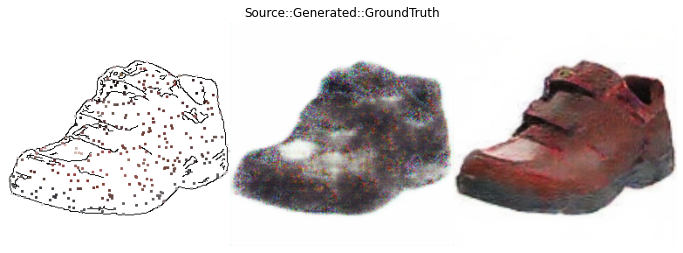

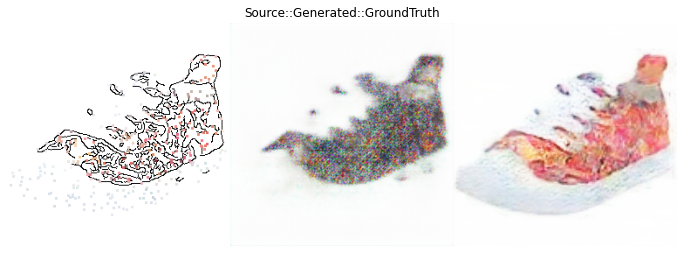

EPOCH: 2.000	error_D: 0.075	error_G: 11.623	(702.55s - 34424.89s remaining)


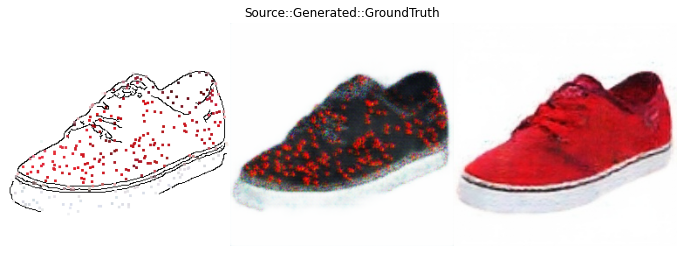

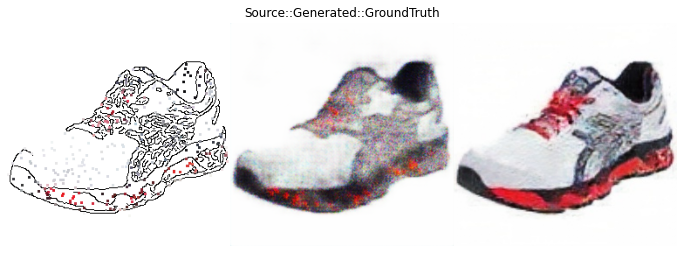

EPOCH: 3.000	error_D: 0.047	error_G: 9.415	(1050.47s - 33965.30s remaining)


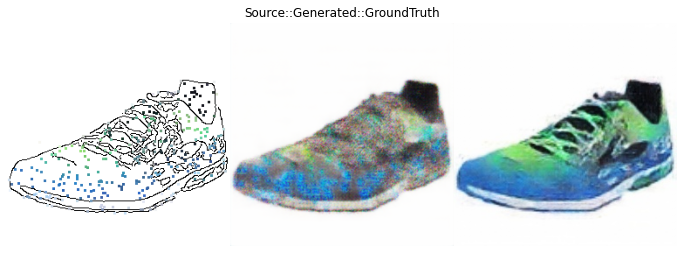

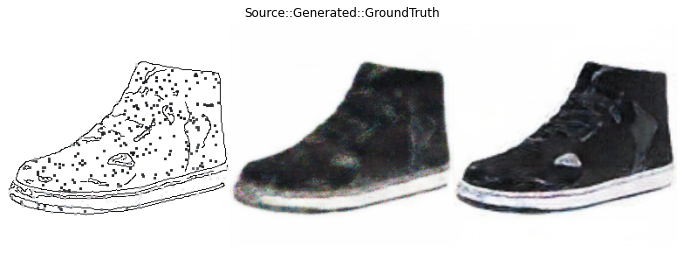

EPOCH: 4.000	error_D: 0.045	error_G: 8.266	(1398.48s - 33563.47s remaining))


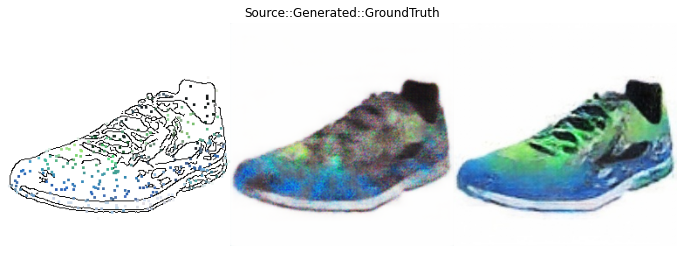

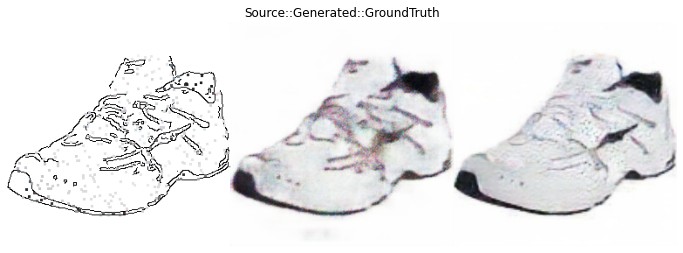

EPOCH: 5.000	error_D: 0.037	error_G: 7.565	(1742.86s - 33114.28s remaining)


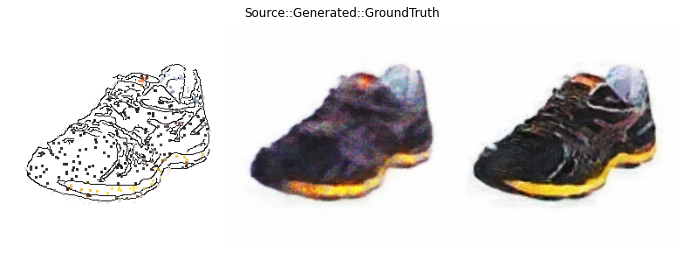

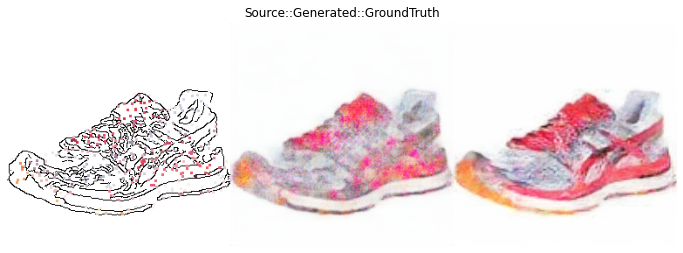

EPOCH: 6.000	error_D: 0.036	error_G: 7.108	(2083.99s - 32649.14s remaining)


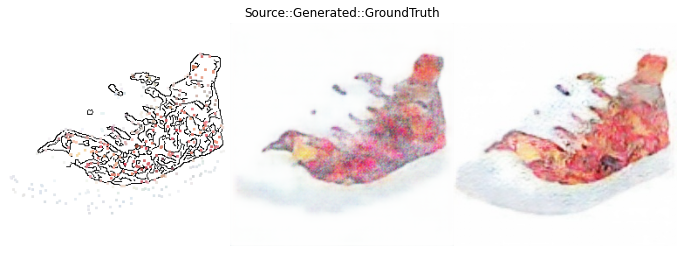

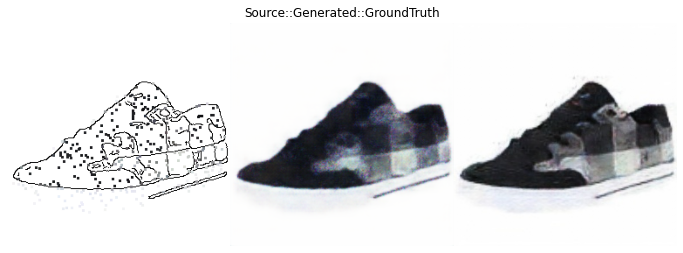

EPOCH: 7.000	error_D: 0.028	error_G: 6.727	(2422.24s - 32181.22s remaining)


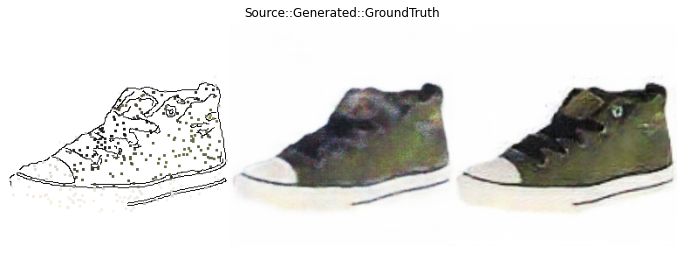

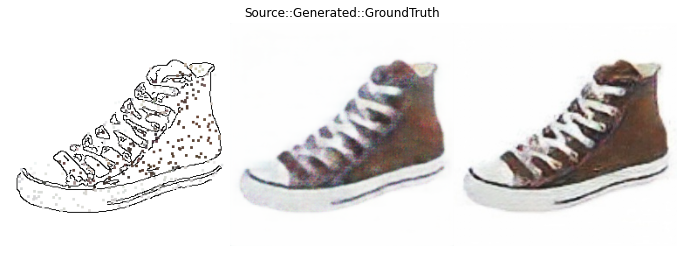

EPOCH: 8.000	error_D: 0.027	error_G: 6.439	(2756.30s - 31697.50s remaining)


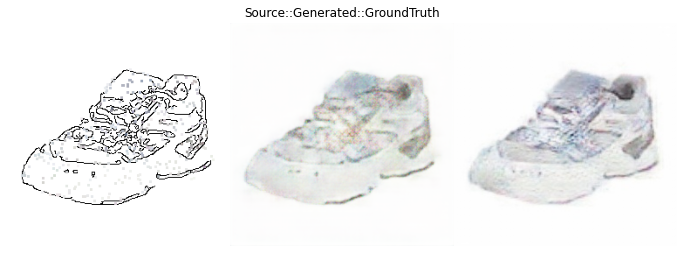

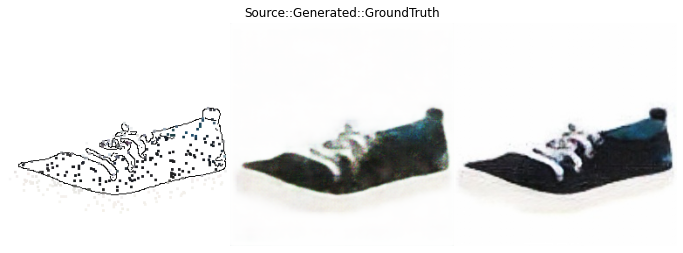

EPOCH: 9.000	error_D: 0.026	error_G: 6.164	(3089.14s - 31234.66s remaining)


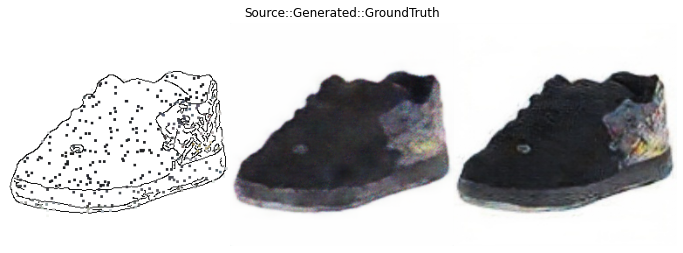

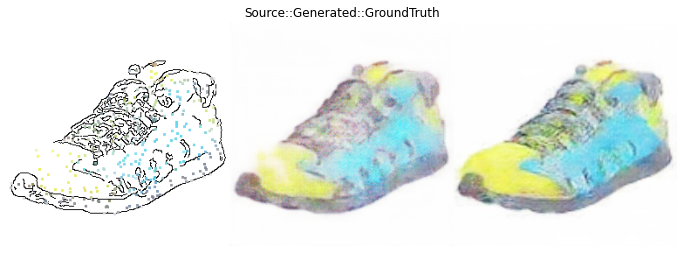

EPOCH: 10.000	error_D: 0.031	error_G: 5.965	(3426.24s - 30836.18s remaining)


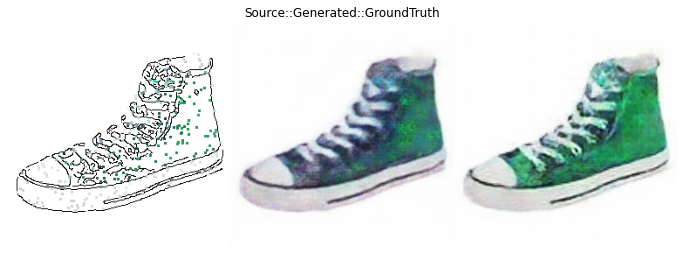

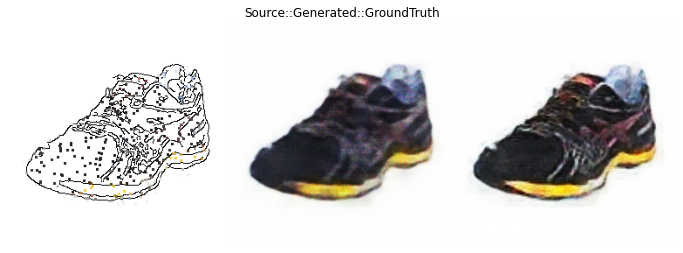

EPOCH: 11.000	error_D: 0.025	error_G: 5.729	(3760.99s - 30429.83s remaining)


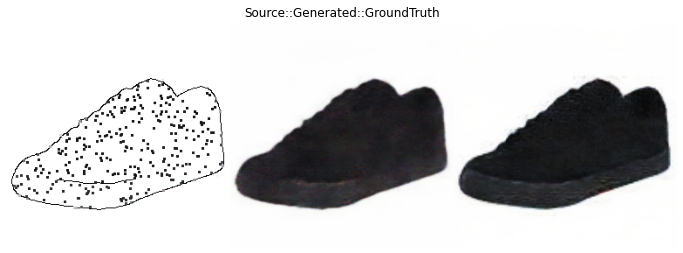

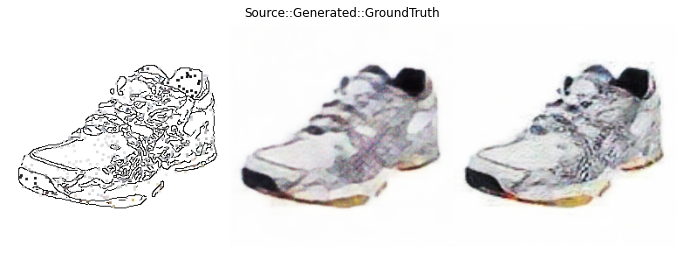

EPOCH: 12.000	error_D: 0.035	error_G: 5.623	(4097.56s - 30048.75s remaining)


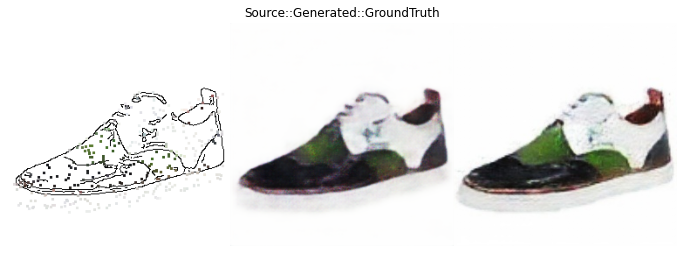

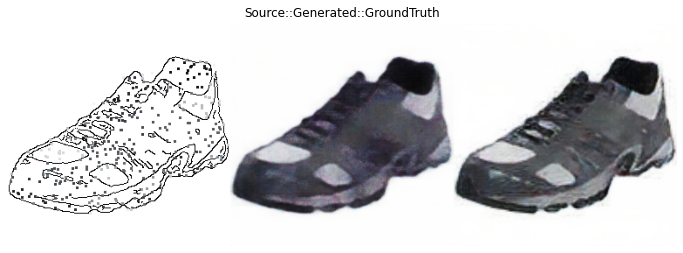

EPOCH: 13.000	error_D: 0.019	error_G: 5.460	(4445.68s - 29751.87s remaining)


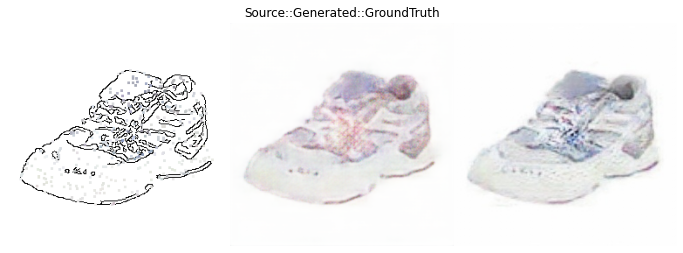

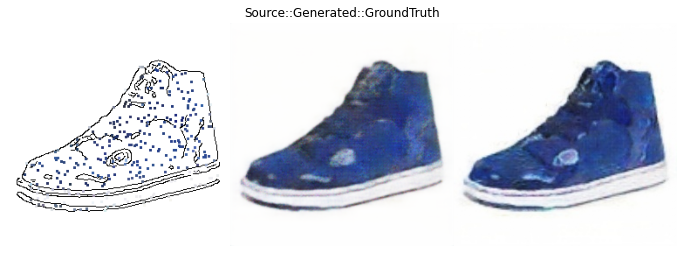

EPOCH: 14.000	error_D: 0.031	error_G: 5.339	(4785.67s - 29397.66s remaining)


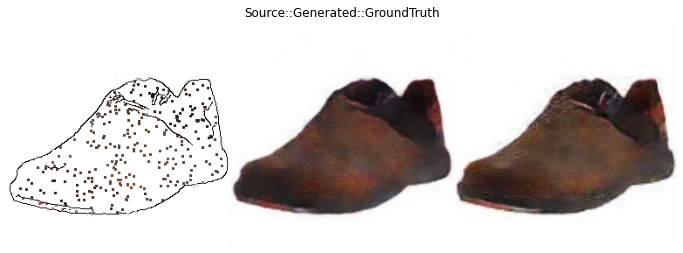

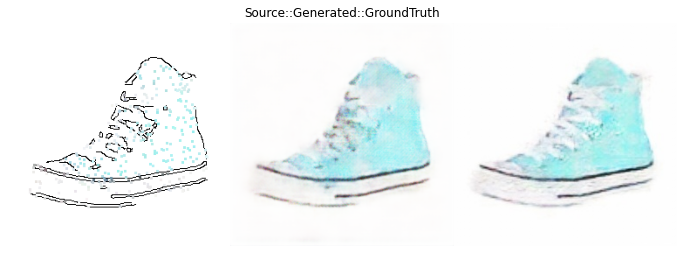

EPOCH: 15.000	error_D: 0.024	error_G: 5.232	(5124.29s - 29037.64s remaining)


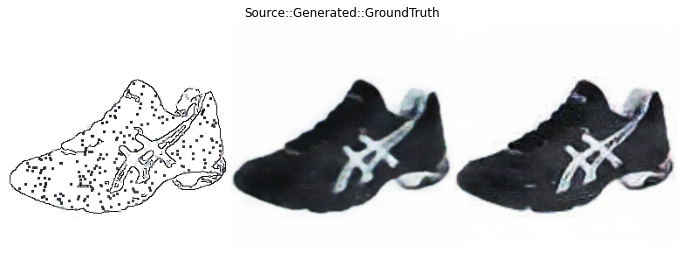

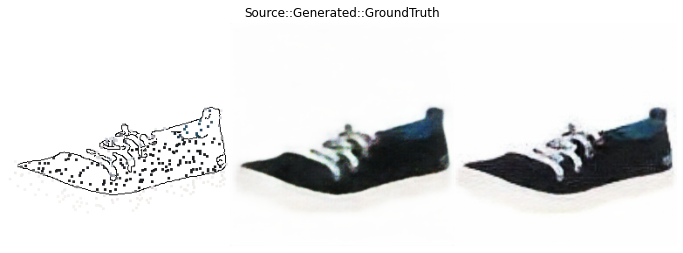

EPOCH: 16.000	error_D: 0.024	error_G: 5.147	(5463.33s - 28682.48s remaining)


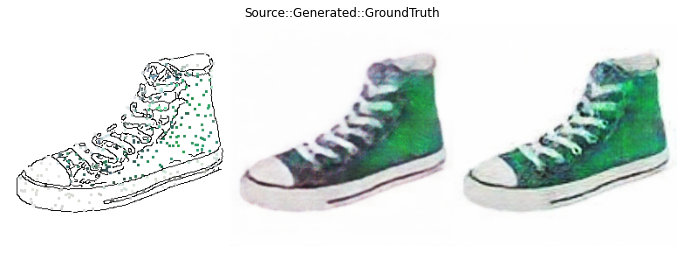

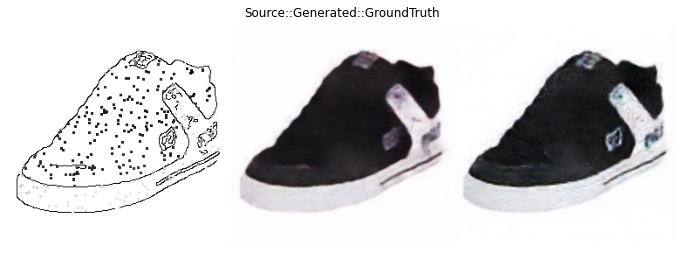

EPOCH: 17.000	error_D: 0.020	error_G: 5.043	(5799.68s - 28316.06s remaining)


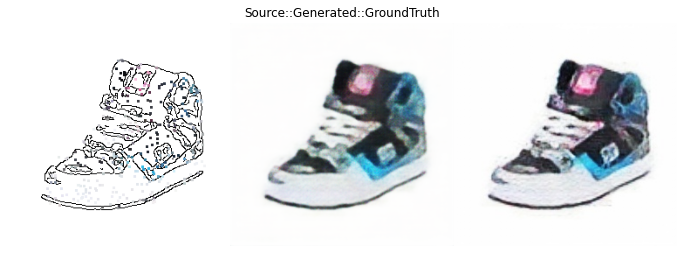

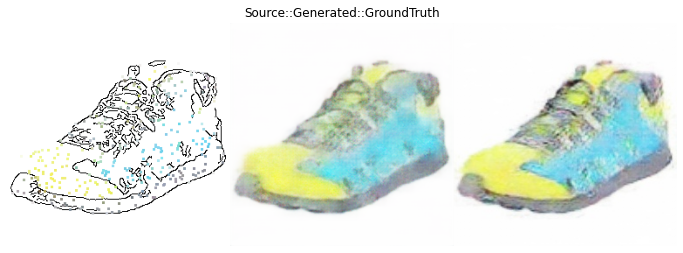

EPOCH: 18.000	error_D: 0.020	error_G: 4.947	(6135.85s - 27952.23s remaining)


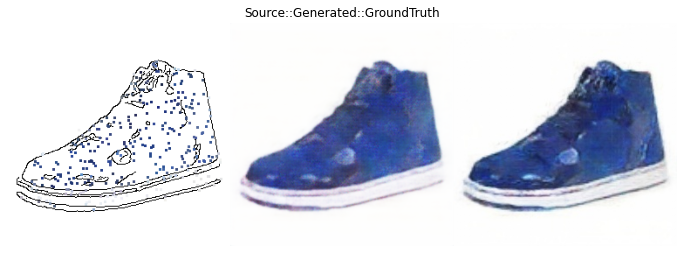

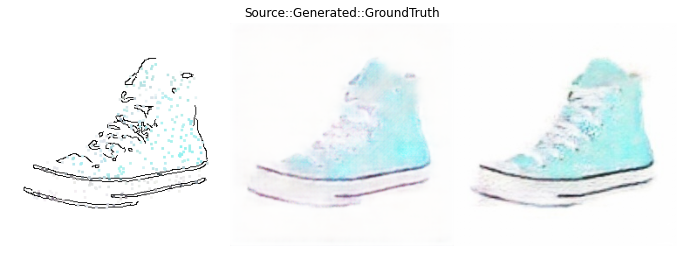

EPOCH: 19.000	error_D: 0.025	error_G: 5.034	(6472.27s - 27592.31s remaining)


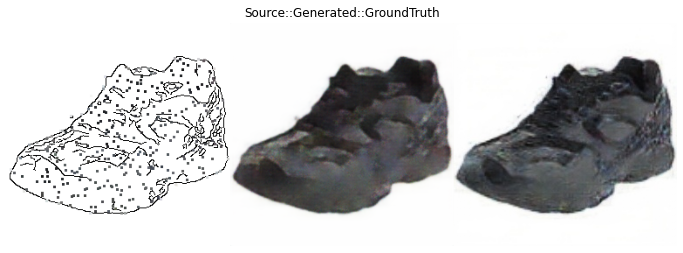

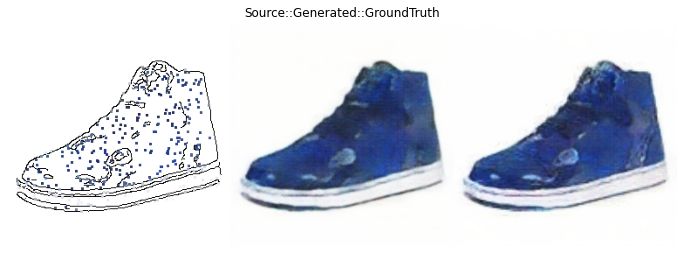

EPOCH: 20.000	error_D: 0.023	error_G: 4.802	(6805.58s - 27222.34s remaining)


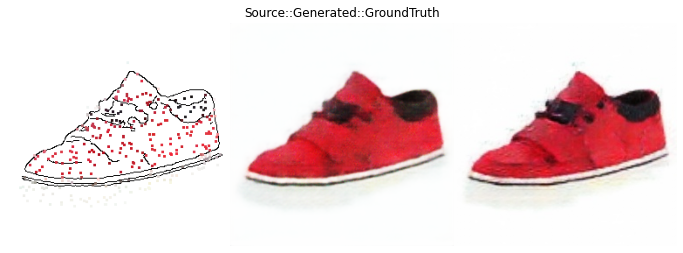

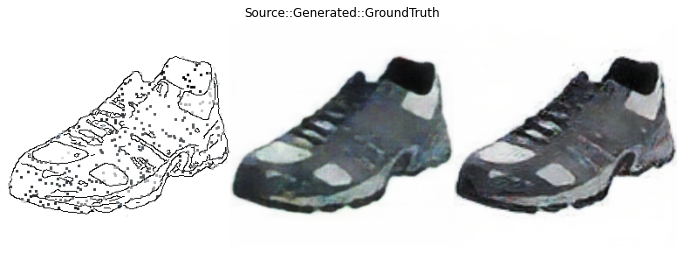

EPOCH: 21.000	error_D: 0.022	error_G: 4.785	(7127.28s - 26812.14s remaining)


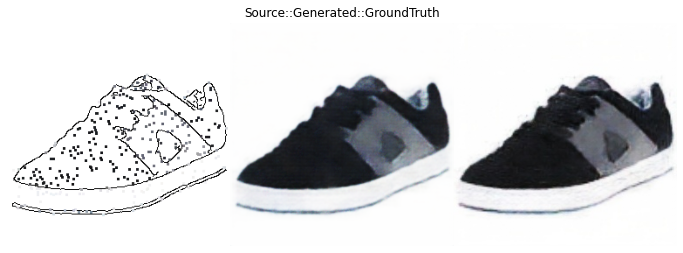

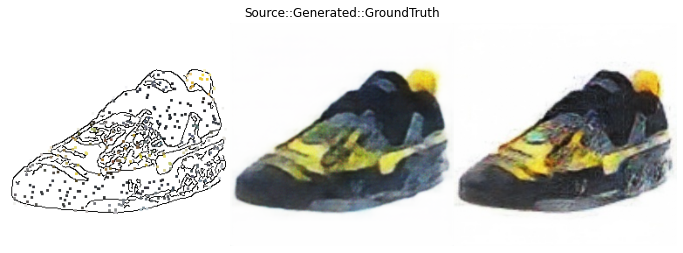

EPOCH: 22.000	error_D: 0.026	error_G: 4.757	(7448.99s - 26410.05s remaining)


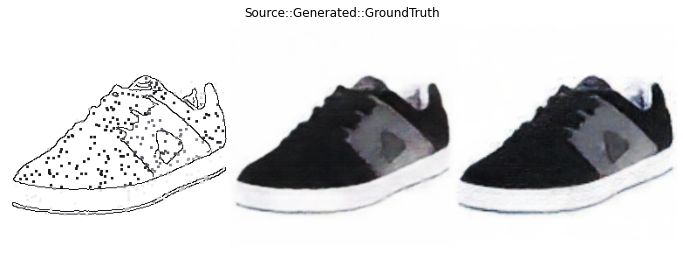

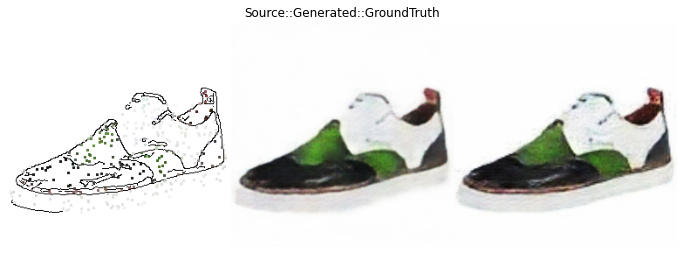

EPOCH: 23.000	error_D: 0.025	error_G: 4.670	(7771.98s - 26019.25s remaining)


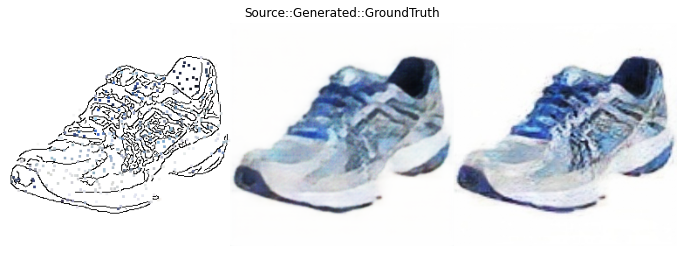

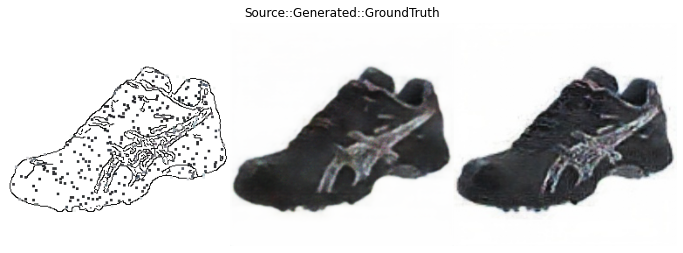

EPOCH: 24.000	error_D: 0.019	error_G: 4.589	(8094.97s - 25634.06s remaining)


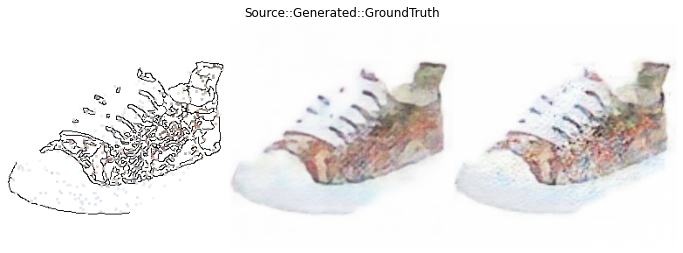

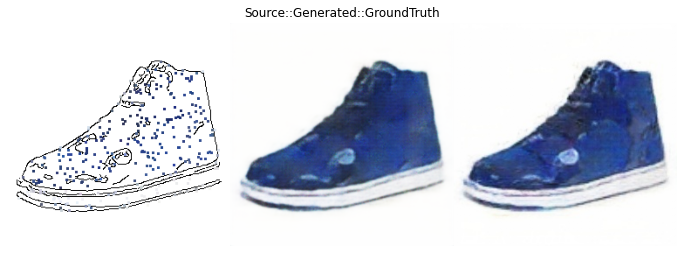

EPOCH: 25.000	error_D: 0.025	error_G: 4.611	(8416.00s - 25248.00s remaining)


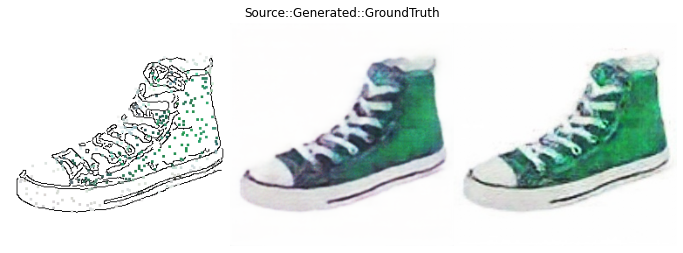

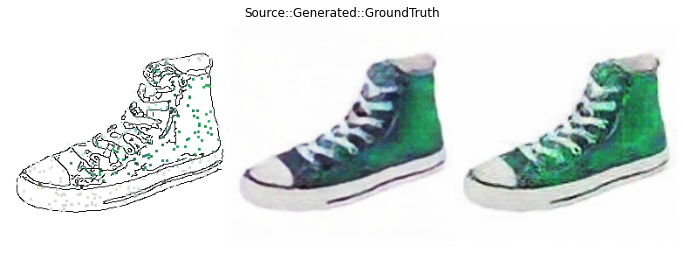

EPOCH: 26.000	error_D: 0.022	error_G: 4.555	(8743.77s - 24886.12s remaining)


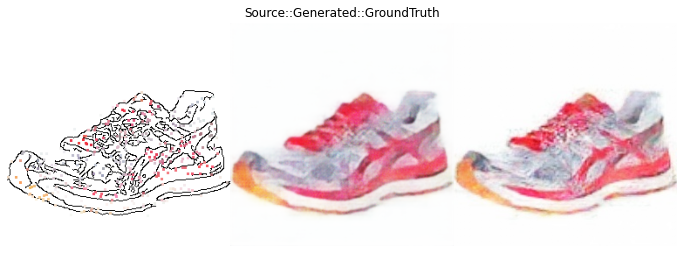

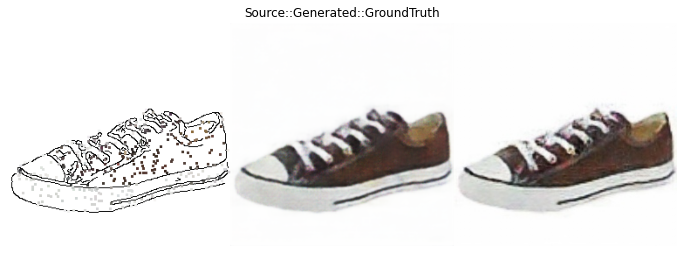

EPOCH: 27.000	error_D: 0.021	error_G: 4.505	(9090.38s - 24577.69s remaining)


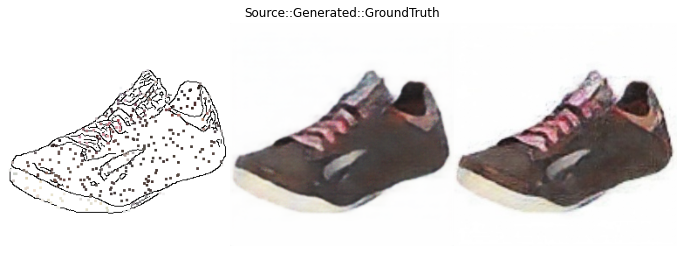

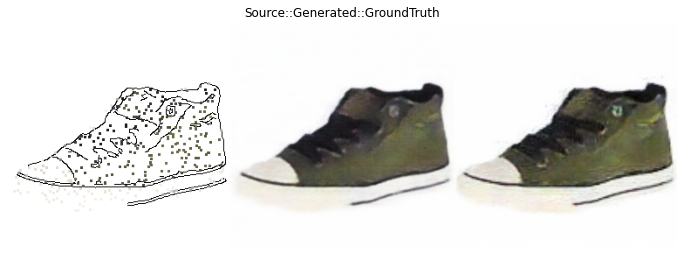

EPOCH: 28.000	error_D: 0.017	error_G: 4.478	(9430.70s - 24250.36s remaining)


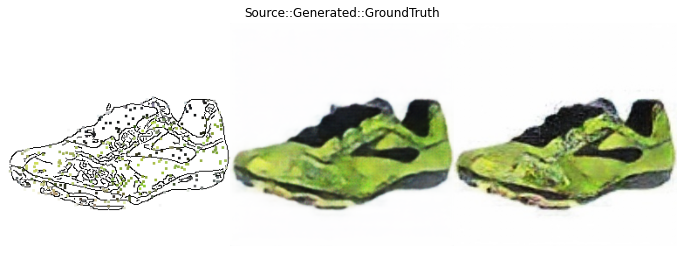

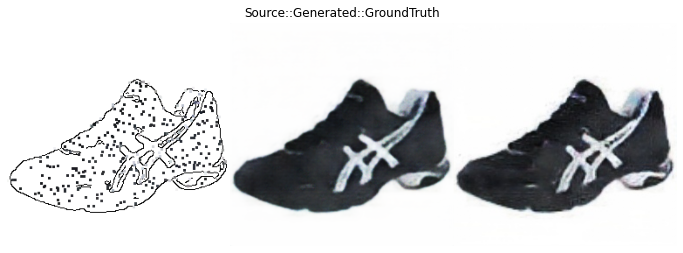

EPOCH: 29.000	error_D: 0.022	error_G: 4.429	(9764.93s - 23907.25s remaining)


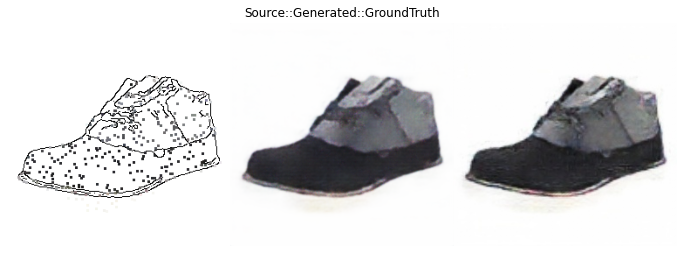

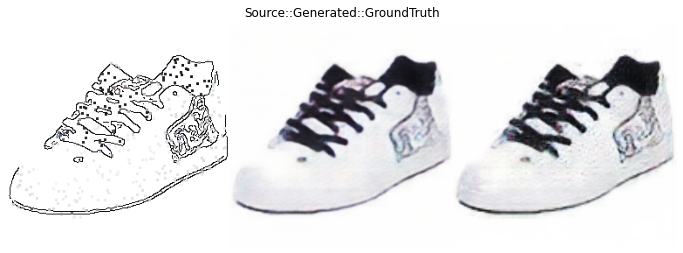

EPOCH: 30.000	error_D: 0.021	error_G: 4.386	(10105.31s - 23579.07s remaining)


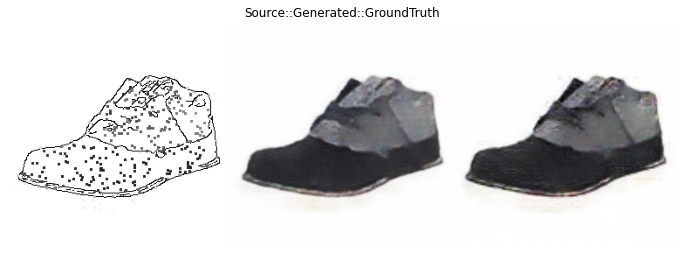

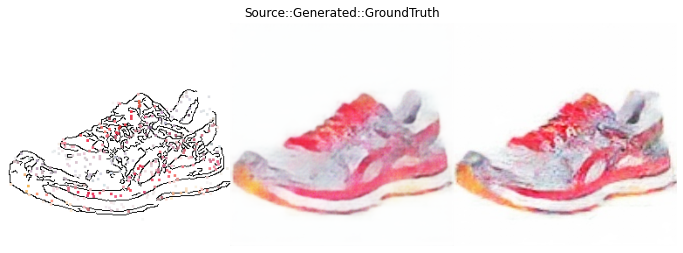

EPOCH: 31.000	error_D: 0.021	error_G: 4.440	(10445.46s - 23249.57s remaining)


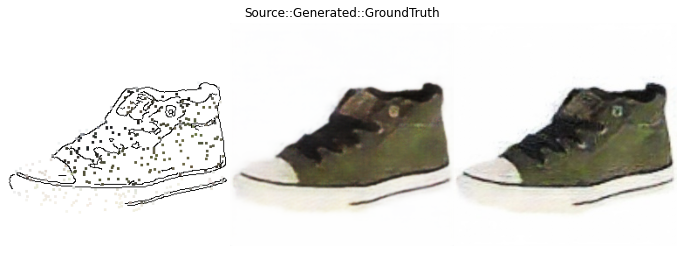

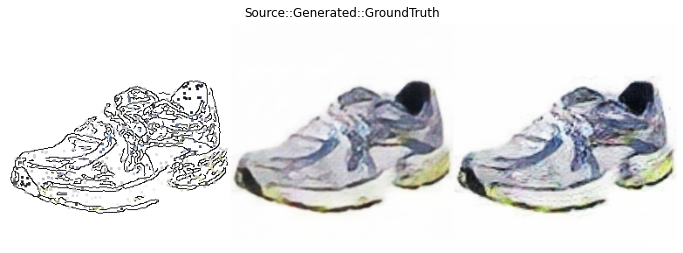

EPOCH: 32.000	error_D: 0.016	error_G: 4.326	(10789.07s - 22926.77s remaining)


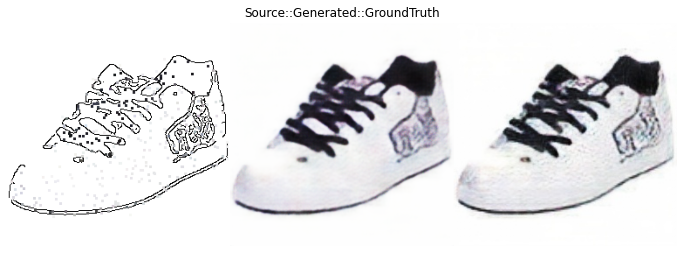

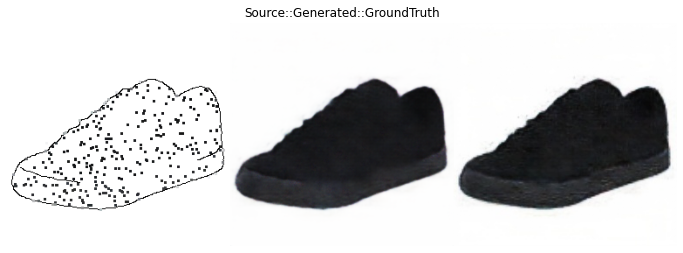

EPOCH: 33.000	error_D: 0.044	error_G: 4.332	(11114.50s - 22565.80s remaining)


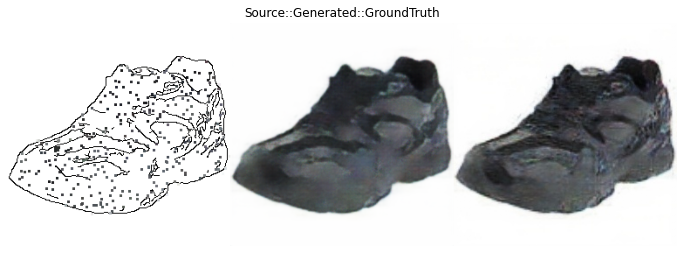

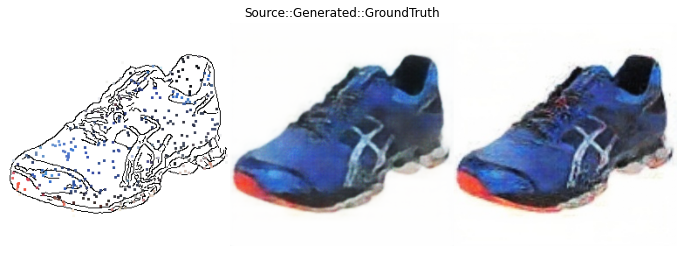

EPOCH: 34.000	error_D: 0.007	error_G: 4.274	(11435.83s - 22198.97s remaining)


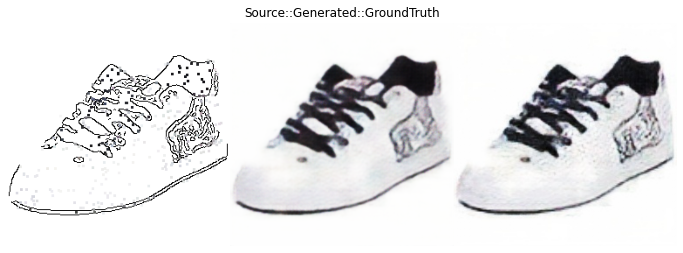

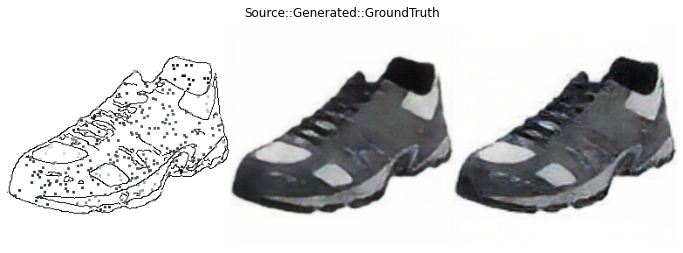

EPOCH: 35.000	error_D: 0.015	error_G: 4.273	(11758.57s - 21837.34s remaining)


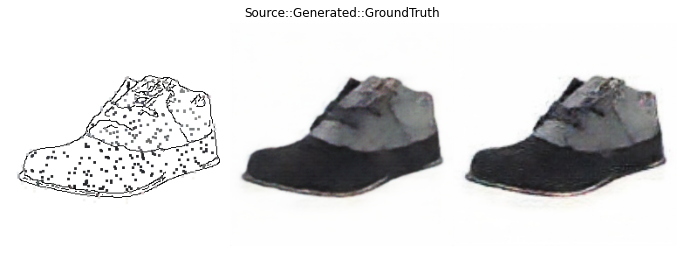

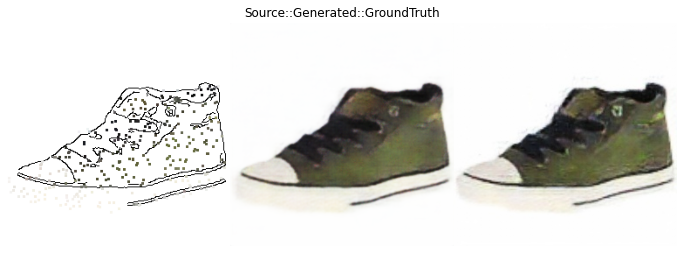

EPOCH: 36.000	error_D: 0.017	error_G: 4.271	(12080.70s - 21476.80s remaining)


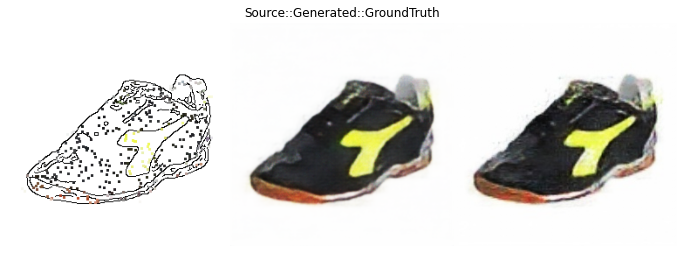

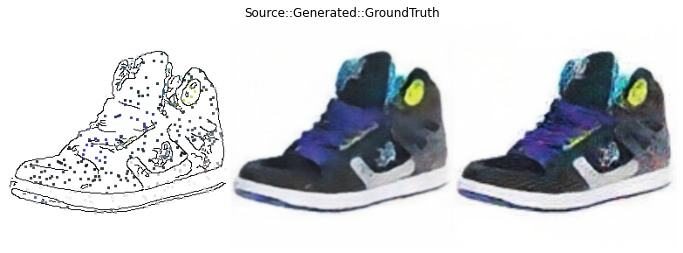

EPOCH: 37.000	error_D: 0.022	error_G: 4.194	(12411.04s - 21132.32s remaining)


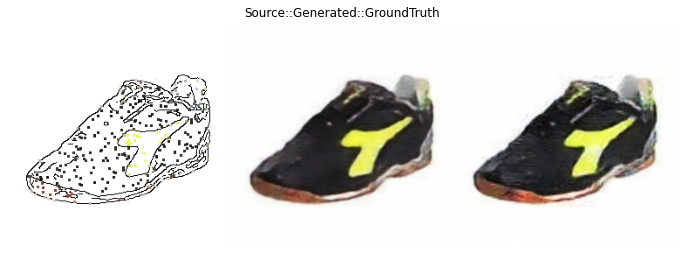

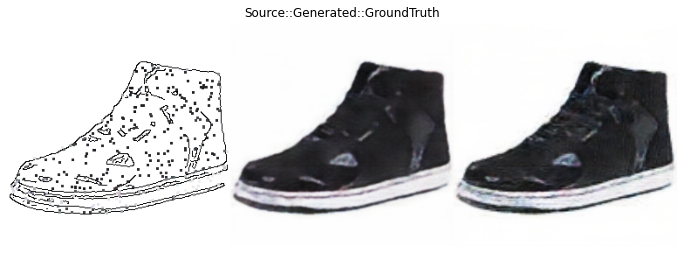

EPOCH: 38.000	error_D: 0.019	error_G: 4.183	(12755.96s - 20812.36s remaining)


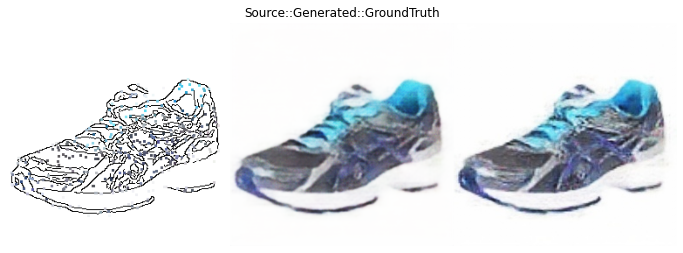

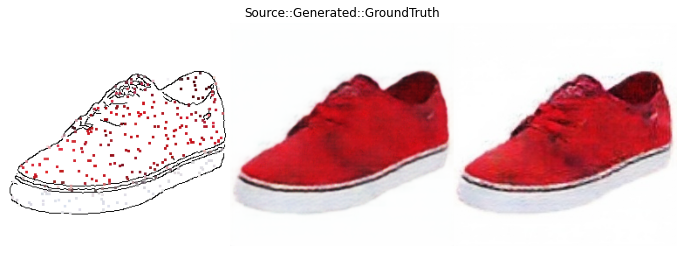

EPOCH: 38.982	error_D: 0.003	error_G: 4.254	(13088.11s - 20486.80s remaining)

KeyboardInterrupt: 

In [ ]:
# TODO: Training Loop
n_epochs = 100
log = Report(n_epochs)
for epoch in range(n_epochs):
    N = len(train_dl)
    for bx, batch in enumerate(train_dl):
        real_source, real_target = batch
        fake_target = generator(real_source)

        error_D = discriminator_train_step(real_source, real_target, fake_target)
        error_G = generator_train_step(real_source, fake_target)

        log.record(pos=epoch+(1+bx)/N, error_D=error_D.item(), error_G=error_G.item(), end='\r')
    log.report_avgs(epoch+1)
    [sample_prediction() for _ in range(2)]

In [ ]:
!mkdir 'pix2pix'

In [ ]:
def save_checkpoint(discriminator, generator, d_optimizer, g_optimizer, epoch, save_path):
    torch.save({'discriminator_state_dict': discriminator.state_dict(),
               'generator_state_dict': generator.state_dict(),
               'd_optimizer_state_dict': d_optimizer.state_dict(),
               'g_optimizer_state_dict': g_optimizer.state_dict(),
               'epoch': epoch
               }, save_path)

In [ ]:
def load_checkpoint(discriminator, generator, d_optimizer, g_optimizer, load_path):
    checkpoint = torch.load(load_path)
    discriminator.load_state_dict(checkpoint['discriminator_state_dict'])
    generator.load_state_dict(checkpoint['generator_state_dict'])
    d_optimizer.load_state_dict(checkpoint['d_optimizer_state_dict'])
    g_optimizer.load_state_dict(checkpoint['g_optimizer_state_dict'])
    epoch = checkpoint['epoch']
    
    return discriminator, generator, d_optimizer, g_optimizer, epoch

In [ ]:
save_path = 'pix2pix/pix_checkpoint.pth'

In [ ]:
save_checkpoint(discriminator, generator, d_optimizer, g_optimizer, epoch, save_path)